## Importing the dataset
**Data Preparation and Preprocessing**

In [ ]:
import pandas as pd
import numpy as np

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

raw_reviews = pd.read_csv('/content/sample_data/backmarket_reviews.csv')
## print shape of dataset with rows and columns and information
print ("The shape of the  data is (row, column):"+ str(raw_reviews.shape))
print (raw_reviews.info())

The shape of the  data is (row, column):(19000, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19000 entries, 0 to 18999
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Username       19000 non-null  object
 1   Total reviews  19000 non-null  object
 2   Location       19000 non-null  object
 3   Date           19000 non-null  object
 4   Content        19000 non-null  object
 5   Rating         19000 non-null  int64 
dtypes: int64(1), object(5)
memory usage: 890.8+ KB
None


In [ ]:
raw_reviews.head()

,Username,Total reviews,Location,Date,Content,Rating
0,03k P,295K reviews,GB,"07 26, 2024",OutstandingOutstanding. I'm now the proud owne...,5
1,Prajeet Gour,5.4K reviews,GB,"07 28, 2024",I recently purchased an iPhone from‚I recently...,4
2,Norman Elliott,1.6K reviews,GB,"07 26, 2024",A great experienceI have had an excellent expe...,5
3,Efemena O,4,GB,"07 25, 2024","Im extremely thankfulI‚ôm extremely thankful, ...",5
4,Anthony - Manchester,2s,GB,"07 21, 2024","Great website, won‚ôt buy anywhere else now!Gr...",5


In [ ]:
#Creating a copy
process_reviews=raw_reviews.copy()

#Checking for null values
process_reviews.isnull().sum()

,0
Username,0
Total reviews,0
Location,0
Date,0
Content,0
Rating,0


In [ ]:
process_reviews['Content']=process_reviews['Content'].fillna('Missing')

## Creating 'sentiment' column
**This is an important preprocessing phase to decide the outcome column (sentiment of review) based on the overall score. If the score is greater than 3, the sentiment is considered as positive and if the value is less than 3 it is negative If it is equal to 3, we take that as neutral sentiment**

In [ ]:
#Figuring out the distribution of categories
process_reviews['Rating'].value_counts()

,count
Rating,
5,14851
1,2278
4,1261
2,330
3,280


In [ ]:
# creating a function to return sentiment value based on the overall rating

def f(row):

    '''This function returns sentiment value based on the overall ratings from the user'''

    if row['Rating'] == 3.0:
        val = 'Neutral'
    elif row['Rating'] == 1.0 or row['Rating'] == 2.0:
        val = 'Negative'
    elif row['Rating'] == 4.0 or row['Rating'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [ ]:
#Applying the function in our new column

process_reviews['Sentiment'] = process_reviews.apply(f, axis=1)
process_reviews.head()

,Username,Total reviews,Location,Date,Content,Rating,Sentiment
0,03k P,295K reviews,GB,"07 26, 2024",OutstandingOutstanding. I'm now the proud owne...,5,Positive
1,Prajeet Gour,5.4K reviews,GB,"07 28, 2024",I recently purchased an iPhone from‚I recently...,4,Positive
2,Norman Elliott,1.6K reviews,GB,"07 26, 2024",A great experienceI have had an excellent expe...,5,Positive
3,Efemena O,4,GB,"07 25, 2024","Im extremely thankfulI‚ôm extremely thankful, ...",5,Positive
4,Anthony - Manchester,2s,GB,"07 21, 2024","Great website, won‚ôt buy anywhere else now!Gr...",5,Positive


In [ ]:
process_reviews['Sentiment'].value_counts()

,count
Sentiment,
Positive,16112
Negative,2608
Neutral,280


## Handling time column

**Here we have an unusual review time column which has date and year, once we split both we will split the date further into month and date.**

In [ ]:
# new data frame which has date and year
new = process_reviews["Date"].str.split(",", n = 1, expand = True)

# making separate date column from new data frame
process_reviews["month_day"]= new[0]

# making separate year column from new data frame
process_reviews["year"]= new[1]

process_reviews=process_reviews.drop(['Date'], axis=1)
process_reviews.head()

,Username,Total reviews,Location,Content,Rating,Sentiment,month_day,year
0,03k P,295K reviews,GB,OutstandingOutstanding. I'm now the proud owne...,5,Positive,07 26,2024
1,Prajeet Gour,5.4K reviews,GB,I recently purchased an iPhone from‚I recently...,4,Positive,07 28,2024
2,Norman Elliott,1.6K reviews,GB,A great experienceI have had an excellent expe...,5,Positive,07 26,2024
3,Efemena O,4,GB,"Im extremely thankfulI‚ôm extremely thankful, ...",5,Positive,07 25,2024
4,Anthony - Manchester,2s,GB,"Great website, won‚ôt buy anywhere else now!Gr...",5,Positive,07 21,2024


In [ ]:
# Splitting the date
new1 = process_reviews["month_day"].str.split(" ", n = 1, expand = True)

# adding month to the main dataset
process_reviews["month"]= new1[0]

# adding day to the main dataset
process_reviews["day"]= new1[1]

process_reviews=process_reviews.drop(['month_day'], axis=1)
process_reviews.head()

,Username,Total reviews,Location,Content,Rating,Sentiment,year,month,day
0,03k P,295K reviews,GB,OutstandingOutstanding. I'm now the proud owne...,5,Positive,2024,07,26
1,Prajeet Gour,5.4K reviews,GB,I recently purchased an iPhone from‚I recently...,4,Positive,2024,07,28
2,Norman Elliott,1.6K reviews,GB,A great experienceI have had an excellent expe...,5,Positive,2024,07,26
3,Efemena O,4,GB,"Im extremely thankfulI‚ôm extremely thankful, ...",5,Positive,2024,07,25
4,Anthony - Manchester,2s,GB,"Great website, won‚ôt buy anywhere else now!Gr...",5,Positive,2024,07,21


## Text Preprocessing and Cleaning
**Let's begin our text processing by removing the punctuations**

In [ ]:
#NLTK libraries
import nltk
import re
import string

# performing text processing.

def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [ ]:
process_reviews['Content']=process_reviews['Content'].apply(lambda x:review_cleaning(x))
process_reviews.head()

,Username,Total reviews,Location,Content,Rating,Sentiment,year,month,day
0,03k P,295K reviews,GB,outstandingoutstanding im now the proud owner ...,5,Positive,2024,07,26
1,Prajeet Gour,5.4K reviews,GB,i recently purchased an iphone from‚i recently...,4,Positive,2024,07,28
2,Norman Elliott,1.6K reviews,GB,a great experiencei have had an excellent expe...,5,Positive,2024,07,26
3,Efemena O,4,GB,im extremely thankfuli‚ôm extremely thankful i...,5,Positive,2024,07,25
4,Anthony - Manchester,2s,GB,great website won‚ôt buy anywhere else nowgrea...,5,Positive,2024,07,21


**We have removed all punctuation in our review column**

## Review text-Stop words
**General nltk stop words contains words like not,hasn't,would'nt which actually conveys a negative sentiment. If we remove that it will end up contradicting the target variable(sentiment). So I have curated the stop words which doesn't have any negative sentiment or any negative alternatives**

In [ ]:
stop_words= ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each',
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above',
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't",
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from',
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs',
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [ ]:
process_reviews['Content'] = process_reviews['Content'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
process_reviews.head()

,Username,Total reviews,Location,Content,Rating,Sentiment,year,month,day
0,03k P,295K reviews,GB,outstandingoutstanding im proud owner tablet c...,5,Positive,2024,07,26
1,Prajeet Gour,5.4K reviews,GB,recently purchased iphone from‚i recently purc...,4,Positive,2024,07,28
2,Norman Elliott,1.6K reviews,GB,great experiencei excellent experience company...,5,Positive,2024,07,26
3,Efemena O,4,GB,im extremely thankfuli‚ôm extremely thankful g...,5,Positive,2024,07,25
4,Anthony - Manchester,2s,GB,great website won‚ôt buy anywhere else nowgrea...,5,Positive,2024,07,21


We have removed all the stop words in the review column

## Year vs Sentiment count

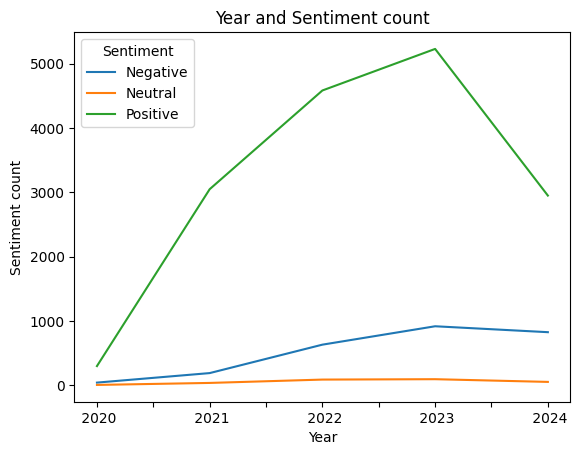

In [ ]:
#Visualization libraries
import matplotlib.pyplot as plt
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline

# visualize the year vs sentiment count

process_reviews.groupby(['year','Sentiment'])['Sentiment'].count().unstack().plot(legend=True)
plt.title('Year and Sentiment count')
plt.xlabel('Year')
plt.ylabel('Sentiment count')
plt.show()

## Day of month vs Reviews count
**checking if there are any relationship between reviews and day of month**

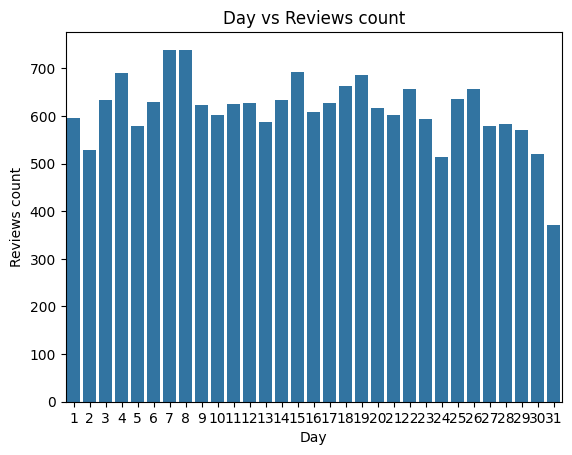

In [ ]:
#import the nexcessary libraries
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob


#Creating a dataframe
day=pd.DataFrame(process_reviews.groupby('day')['Content'].count()).reset_index()
day['day']=day['day'].astype('int64')
day.sort_values(by=['day'])

#Plotting the graph
sns.barplot(x="day", y="Content", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

## Creating few more features for text analysis
**Now, let's create polarity, review length and word count**

**Polarity:** **Textblob is used for for figuring out the rate of sentiment . It is between [-1,1] where -1 is negative and 1 is positive polarity**

**Review length:** **length of the review which includes each letters and spaces**

**Word length:** **This measures how many words are there in review**

In [ ]:
# creating polarity, review length and word count

#calculating polarity
process_reviews['polarity'] = process_reviews['Content'].map(lambda text: TextBlob(text).sentiment.polarity)

#calculating review length
process_reviews['review_len'] = process_reviews['Content'].astype(str).apply(len)

#calculating word count
process_reviews['word_count'] = process_reviews['Content'].apply(lambda x: len(str(x).split()))

In [ ]:
process_reviews.head()

,Username,Total reviews,Location,Content,Rating,Sentiment,year,month,day,polarity,review_len,word_count
0,03k P,295K reviews,GB,outstandingoutstanding im proud owner tablet c...,5,Positive,2024,07,26,0.435714,352,45
1,Prajeet Gour,5.4K reviews,GB,recently purchased iphone from‚i recently purc...,4,Positive,2024,07,28,0.197744,479,56
2,Norman Elliott,1.6K reviews,GB,great experiencei excellent experience company...,5,Positive,2024,07,26,0.600000,124,16
3,Efemena O,4,GB,im extremely thankfuli‚ôm extremely thankful g...,5,Positive,2024,07,25,0.196563,199,28
4,Anthony - Manchester,2s,GB,great website won‚ôt buy anywhere else nowgrea...,5,Positive,2024,07,21,0.263474,239,35


## Sentiment polarity distribution
**Let's look at our polarity distribution**

In [ ]:
#import necessary libraries
from scipy.interpolate import interp1d
from itertools import cycle
import cufflinks as cf

'''cf.go_offline()
cf.set_config_file(offline=False, world_readable=True) '''

# Initialize cufflinks for offline mode
cf.go_offline()
cf.set_config_file(world_readable=True)

# Ensure proper rendering in Google Colab
import plotly.io as pio
pio.renderers.default = 'colab'

# Creating the histogram for sentiment polarity distribution
process_reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='Polarity',
    linecolor='black',
    yTitle='Count',
    title='Sentiment Polarity Distribution'
)

## Review Rating Distribution


In [ ]:
#check overall distribution of ratings
process_reviews['Rating'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

## Review Text Length Distribution
**Let's check out the length of review text**

In [ ]:
#check the length of review length
process_reviews['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

## Review Text Word Count Distribution


In [ ]:
#check word count distribution for each review text
process_reviews['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')

## Deep Text Analysis Using N-gram analysis

## Monogram analysis
**Plotting the most frequent one word in reviews based on sentiments**

In [ ]:
# import the necessary libraries
from collections import defaultdict
from wordcloud import WordCloud,STOPWORDS

#Filtering data by sentiment
review_pos = process_reviews[process_reviews["Sentiment"]=='Positive'].dropna()
review_neu = process_reviews[process_reviews["Sentiment"]=='Neutral'].dropna()
review_neg = process_reviews[process_reviews["Sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

In [ ]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["Content"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Content"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Content"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

In [ ]:
# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

## Bigram analysis
**Plotting the most frequent two words in reviews based on sentiments**

In [ ]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["Content"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Content"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Content"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')

In [ ]:
# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews",
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

## Trigram analysis
**Plotting the most frequent three words in reviews based on sentiments**

In [ ]:
## Get the bar chart from positive reviews ##
for sent in review_pos["Content"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Content"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Content"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

In [ ]:
# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews",
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
iplot(fig, filename='word-plots')


## Wordcloud - Positive reviews


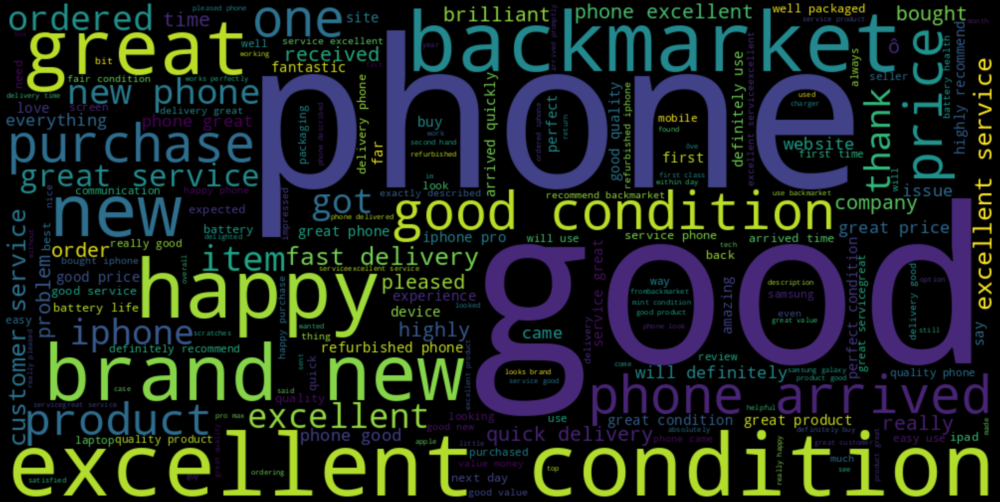

In [ ]:
# Concatenate all positive reviews into a single string
text = ' '.join(review_pos["Content"])

# Generate the word cloud
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='black',
    stopwords=STOPWORDS,
    colormap='viridis'
).generate(text)

# Plot the word cloud
fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k'
)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()


## Wordcloud - Neutral reviews


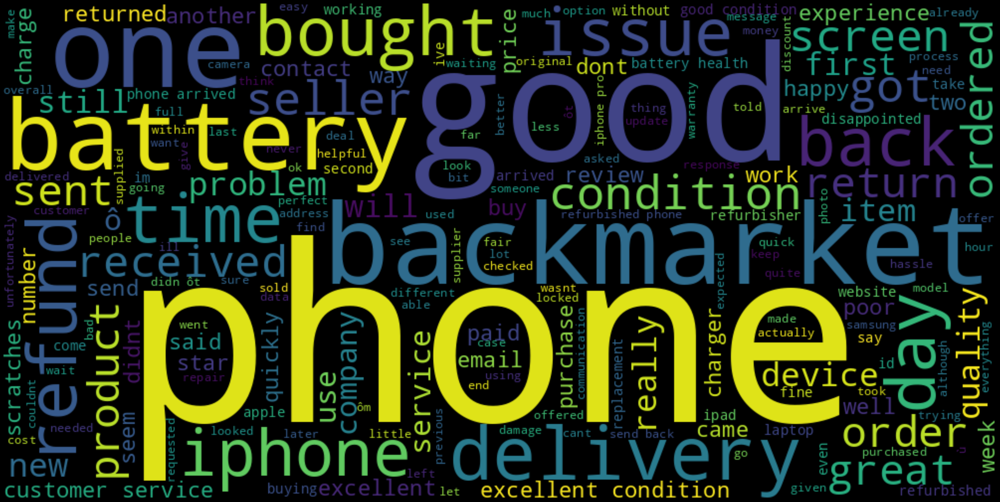

In [ ]:
# Concatenate all positive reviews into a single string
text = ' '.join(review_neu["Content"])

# Generate the word cloud
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='black',
    stopwords=STOPWORDS,
    colormap='viridis'  # You can choose a different colormap if you prefer
).generate(text)

# Plot the word cloud
fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k'
)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Wordcloud - Negative reviews

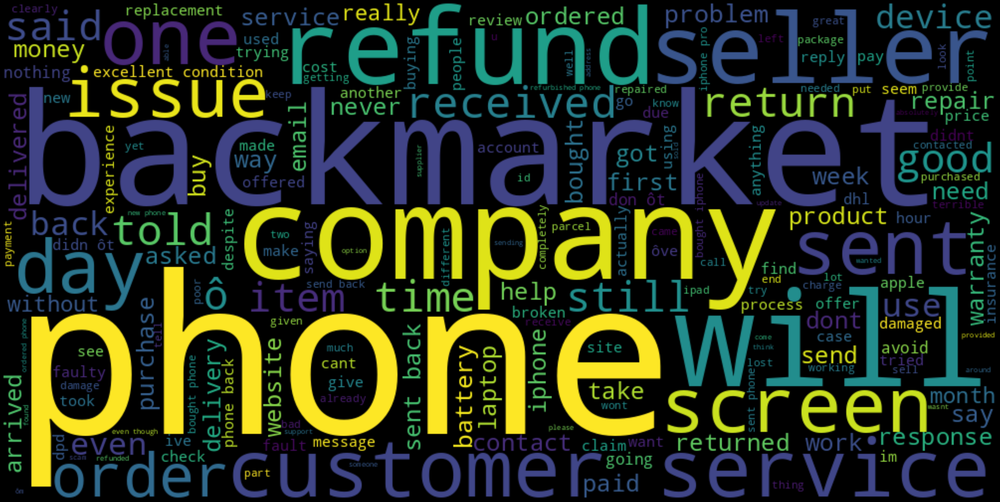

In [ ]:
# Concatenate all positive reviews into a single string
text = ' '.join(review_neg["Content"])

# Generate the word cloud
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='black',
    stopwords=STOPWORDS,
    colormap='viridis'  # You can choose a different colormap if you prefer
).generate(text)

# Plot the word cloud
fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k'
)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

<a id="section-four"></a>
# Extracting Features from Cleaned reviews
**Before building the model for sentiment analysis, it is required to convert the review texts into vector formation as computer cannot understand words and their sentiment**

## Encoding target variable-sentiment
**Let's encode our target variable with Label encoder.**

In [ ]:
from sklearn import preprocessing

# Initialize the LabelEncoder
label_encoder = preprocessing.LabelEncoder()

# Fit and transform the 'Sentiment' column to encode labels
process_reviews['Sentiment']= label_encoder.fit_transform(process_reviews['Sentiment'])

# Display unique encoded values to verify
process_reviews['Sentiment'].unique()

array([2, 1, 0])

In [ ]:
# Retrieve mapping of labels to encoded values
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(label_mapping)


{'Negative': 0, 'Neutral': 1, 'Positive': 2}


In [ ]:
process_reviews['Sentiment'].value_counts()

,count
Sentiment,
2,16112
0,2608
1,280


## Lemmatisation

In [ ]:
#Extracting 'reviews' for processing
review_features=process_reviews.copy()
review_features=review_features[['Content']].reset_index(drop=True)
review_features.head()

,Content
0,outstandingoutstanding im proud owner tablet c...
1,recently purchased iphone from‚i recently purc...
2,great experiencei excellent experience company...
3,im extremely thankfuli‚ôm extremely thankful g...
4,great website won‚ôt buy anywhere else nowgrea...


In [ ]:
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import nltk

# Ensure necessary NLTK data is downloaded
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

# Extracting 'reviews' for processing
review_features = process_reviews.copy()
review_features = review_features[['Content']].reset_index(drop=True)

# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Get the stop words
STOPWORDS = set(stopwords.words('english'))

# Perform lemmatization on the review dataframe
corpus = []
for i in range(len(review_features)):
    # Remove non-alphabetic characters and convert to lower case
    review = re.sub('[^a-zA-Z]', ' ', review_features['Content'][i])
    review = review.lower()

    # Tokenize the review
    review = word_tokenize(review)

    # Lemmatize words and remove stopwords
    review = [lemmatizer.lemmatize(word) for word in review if word not in STOPWORDS]

    # Join words back into a single string
    review = ' '.join(review)

    # Append the processed review to the corpus
    corpus.append(review)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Display a sample processed review
print(corpus[5])

top notchphone great condition arrived day promised date great service easy use app highly


**This is how a line looks like now, as computer cannot understand words and their sentiment we need to convert these words into 1's and 0's**

## TFIDF(Term Frequency — Inverse Document Frequency)
**TF-IDF stands for “Term Frequency — Inverse Document Frequency”. This is a technique to quantify a word in documents, it generally compute a weight to each word which signifies the importance of the word in the document and corpus. This method is a widely used technique in Information Retrieval and Text Mining.**

**Here, splitting as bigram (two words) and consider their combined weight.Also we are taking only the top 95000 words from the reviews.**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(max_features=95000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['Content'])

In [ ]:
X.shape

(19000, 95000)

In [ ]:
#Getting the target variable(encoded)
y=process_reviews['Sentiment']

## Handling Imbalance target feature-SMOTE
**In the target feature above, positive sentiments are more compared to negative and neutral. So it is crucial to balance the classes in such situation. The SMOTE(Synthetic Minority Oversampling Technique) is used to balance out the imbalanced dataset problem. It aims to balance class distribution by randomly increasing minority class examples by replicating them.** <br>

In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter

print(f'Original dataset shape : {Counter(y)}')

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Fit and resample
X_res, y_res = smote.fit_resample(X, y)

# Print resampled dataset shape
print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 16112, 0: 2608, 1: 280})
Resampled dataset shape Counter({2: 16112, 1: 16112, 0: 16112})


## Train-test split(75:25)
**Using train test split function the dataset will be split into 75:25 ratio for train and test set respectively.**

In [ ]:
# Machine Learning libraries
import sklearn
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets


## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=0)

<a id="section-five"></a>
# Model Building: Sentiment Analysis


## Model selection


In [ ]:
# import necessary libraries
from sklearn.model_selection import cross_val_score

# Create instances of each model to be evaluated.
logreg_cv = LogisticRegression(random_state=0)
dt_cv=DecisionTreeClassifier()
knn_cv=KNeighborsClassifier()
svc_cv=SVC()
nb_cv=BernoulliNB()

# Define a dictionary and a list of models for easy access and iteration.
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes'}
cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]

# Evaluate each model using 10-fold cross-validation and print the mean accuracy.
for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

Logistic Regression Test Accuracy: 0.9099473684210526
Decision Tree Test Accuracy: 0.9142105263157895
KNN Test Accuracy: 0.8480000000000001
SVC Test Accuracy: 0.9111052631578949
Naive Bayes Test Accuracy: 0.9170526315789473


## Naive Bayes with Hyperparameter tuning


In [ ]:
'''
# Define parameter grid
param_grid = {
    'alpha': [0.1, 0.5, 1.0, 2.0],  # Smoothing parameter
    'binarize': [0.0, 0.5, 1.0]     # Threshold for binarizing the input
}

# Initialize GridSearchCV with BernoulliNB
clf = GridSearchCV(BernoulliNB(), param_grid, cv=5, verbose=0, n_jobs=-1)

# Fit the model
best_model = clf.fit(X_train,y_train)

# Print the best estimator and mean accuracy
print(best_model.best_estimator_)
print("The mean accuracy of the model is:",best_model.score(X_test,y_test))'''

BernoulliNB(alpha=0.1)
The mean accuracy of the model is: 0.9440582588546839


In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score

# Initialize the Bernoulli Naive Bayes model
nb_model = BernoulliNB(alpha=0.1, binarize=0.0)  # You can adjust alpha and binarize as needed

# Fit the model with the training data
nb_model.fit(X_train, y_train)

# Predict the labels for the test set
y_pred = nb_model.predict(X_test)

# Calculate and print the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy of Bernoulli Naive Bayes classifier on test set: {:.2f}'.format(accuracy))

Accuracy of Bernoulli Naive Bayes classifier on test set: 0.94


## Classification metrics
**Here we plot the confusion matrix with ROC and check our f1 score**

In [ ]:
# Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, cm[i, j],
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


Confusion matrix, without normalization


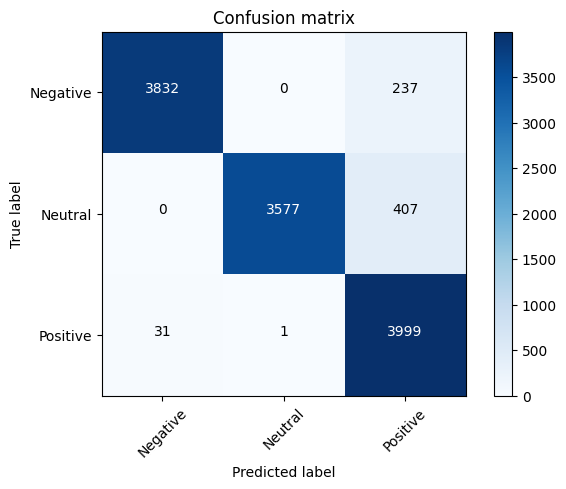

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['Negative','Neutral','Positive'])

In [ ]:
print("Classification Report:\n",classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.94      0.97      4069
           1       1.00      0.90      0.95      3984
           2       0.86      0.99      0.92      4031

    accuracy                           0.94     12084
   macro avg       0.95      0.94      0.94     12084
weighted avg       0.95      0.94      0.94     12084



## ROC-AUC curve


In [ ]:
#from scipy.interpolate import interp

In [ ]:
# import the necessary libraries
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

# Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2,
                                                    random_state=0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=10))
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

In [ ]:
#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

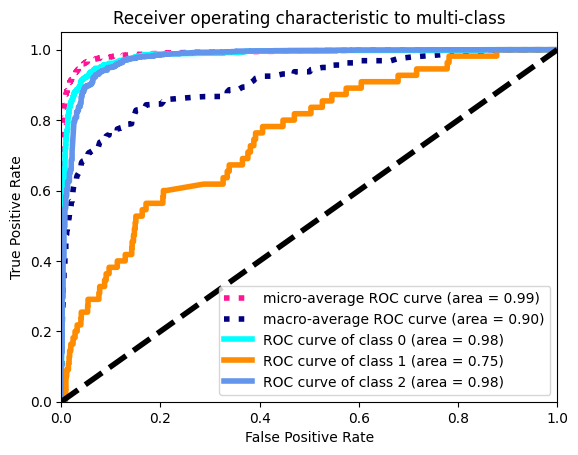

In [ ]:
# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()